# Kaggle Machine Learning Particle Physics

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import trackml

from trackml.dataset import load_event

import random


import plotly
import plotly.offline as offline
offline.init_notebook_mode(connected=True)

import plotly.plotly as py
import plotly.graph_objs as go

import plotly.tools as tls
% matplotlib inline

print ('Complete')

Complete


## File Types

Basic filetype:

    event0000010##-<cells, hits, particles, truth>.csv

In [2]:
csv_path = 'train_100_events/'
fileHead = 'event0000010'

def fileName(number, kind):
    '''
    number = ##
    kind : cells
           hits
           particles
           truth
    '''
    fullFile = csv_path+fileHead+str(number)+'-'+kind+'.csv'
    return fullFile

print ('Complete')

Complete


## Getting Inside Each File Type

**Hits**
    
-  hit_id: numerical identifier of the hit inside the event.
-  x, y, z: measured x, y, z position (in millimeter) of the hit in global coordinates.
-  volume_id: numerical identifier of the detector group.
-  layer_id: numerical identifier of the detector layer inside the group.
-  module_id: numerical identifier of the detector module inside the layer.

![Note](Detector.png)



**Cells**
-  hit_id: numerical identifier of the hit as defined in the hits file.
-  ch0, ch1: channel identifier/coordinates unique within one module.
-  value: signal value information, e.g. how much charge a particle has deposited.
    
    

**Particles**

-  particle_id: numerical identifier of the particle inside the event.
-  vx, vy, vz: initial position or vertex (in millimeters) in global coordinates.
-  px, py, pz: initial momentum (in GeV/c) along each global axis.
-  q: particle charge (as multiple of the absolute electron charge).
-  nhits: number of hits generated by this particle. 

**Truth**

-  hit_id: numerical identifier of the hit as defined in the hits file.
-  particle_id: numerical identifier of the generating particle as defined in the particles file. A value of 0 means that the hit did not originate from a reconstructible particle, but e.g. from detector noise.
-  tx, ty, tz: true intersection point in global coordinates (in millimeters) between the particle trajectory and the sensitive surface.
-  tpx, tpy, tpz: true particle momentum (in GeV/c) in the global coordinate system at the intersection point. The corresponding vector is tangent to the particle trajectory at the intersection point.
-  weight: per-hit weight used for the scoring metric; total sum of weights within one event equals to one.



In [3]:
prefix = 'event000001000'
dfHits, dfCells, dfParticles, dfTruth = load_event('train_100_events/'+prefix)

fileDict = {
    'Hits': dfHits,
    'Cells': dfCells,
    'Particles': dfParticles,
    'Truth': dfTruth
}

print ('Complete')

Complete


In [4]:
for file in fileDict:
    print ('File: {0} \n {1}'.format(file, fileDict[file].head()))
    print ()

File: Hits 
    hit_id          x         y       z  volume_id  layer_id  module_id
0       1 -64.409897 -7.163700 -1502.5          7         2          1
1       2 -55.336102  0.635342 -1502.5          7         2          1
2       3 -83.830498 -1.143010 -1502.5          7         2          1
3       4 -96.109100 -8.241030 -1502.5          7         2          1
4       5 -62.673599 -9.371200 -1502.5          7         2          1

File: Cells 
    hit_id  ch0  ch1     value
0       1  209  617  0.013832
1       1  210  617  0.079887
2       1  209  618  0.211723
3       2   68  446  0.334087
4       3   58  954  0.034005

File: Particles 
         particle_id        vx        vy        vz         px         py  \
0  4503668346847232 -0.009288  0.009861 -0.077879  -0.055269   0.323272   
1  4503737066323968 -0.009288  0.009861 -0.077879  -0.948125   0.470892   
2  4503805785800704 -0.009288  0.009861 -0.077879  -0.886484   0.105749   
3  4503874505277440 -0.009288  0.009861 -0.0778

## Plotting Some Stuff

Lets start with a scatter plot of all positions within this one event file.

In [280]:
# print (dfHits.head())
from mpl_toolkits.mplot3d import Axes3D

depth = (10815)
# depth = 5

x1Array = (dfHits.x[:depth])
y1Array = (dfHits.y[:depth])
z1Array = (dfHits.z[:depth])

x2Array = dfTruth.tx[:depth]
y2Array = dfTruth.ty[:depth]
z2Array = dfTruth.tz[:depth]



trace1 = go.Scatter3d(
    x=x1Array,
    y=y1Array,
    z=z1Array,
    mode = 'markers',
    marker=dict(
        size=2,
#         color='red',
        color = z1Array,
        colorscale='Viridis'
    )
)

trace2 = go.Scatter3d(
    x=x2Array,
    y=y2Array,
    z=z2Array,
    mode = 'markers',
    marker=dict(
        size=8,
        color='blue',
#         colorscale='Viridis'
    )
)

data = [trace1]
fig = go.Figure(data=data)
offline.iplot(fig, filename='simple-3d-scatter')


print ('Complete')

Complete


From this, we can see that the Z axis is the beam axis. 

An XY plot should be radially symmetric

XZ and YZ plots should both look the same

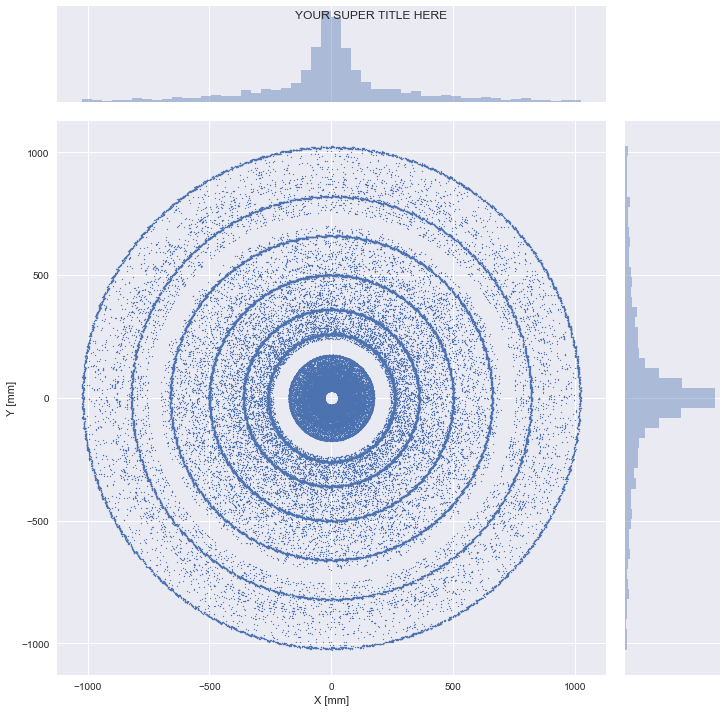

In [5]:
Zview = sns.jointplot(dfHits.x, dfHits.y, stat_func = None, size = 10, s=1)

# Zview.axes.set_title('LALALALALA')
plt.suptitle('YOUR SUPER TITLE HERE')
# sns.plt.title('YOUR TITLE HERE')

Zview.set_axis_labels('X [mm]', 'Y [mm]')
plt.show(Zview)

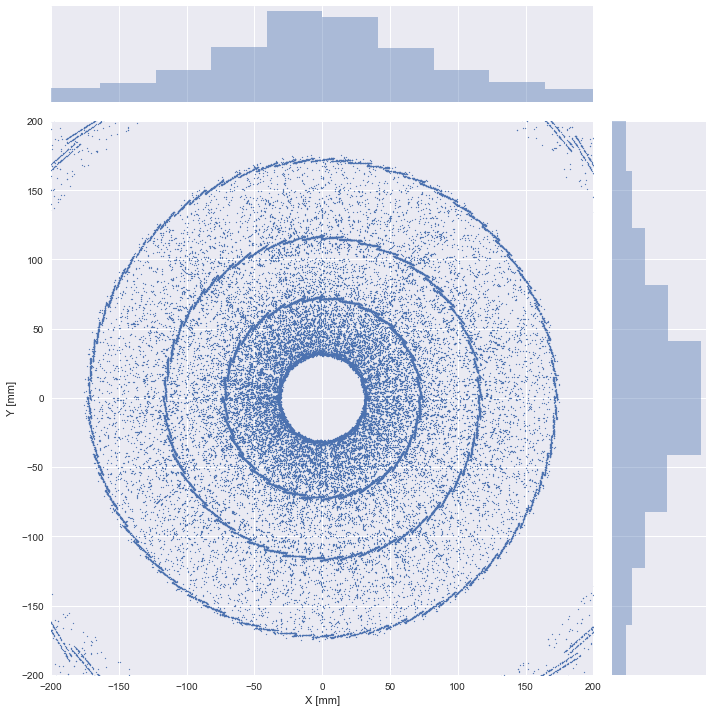

In [65]:
square = 200
ZZoom = sns.jointplot(dfHits.x, dfHits.y, stat_func = None, 
                      size = 10, s=1, 
                      xlim = {-square,square}, 
                      ylim = {-square,square})
ZZoom.set_axis_labels('X [mm]', 'Y [mm]')

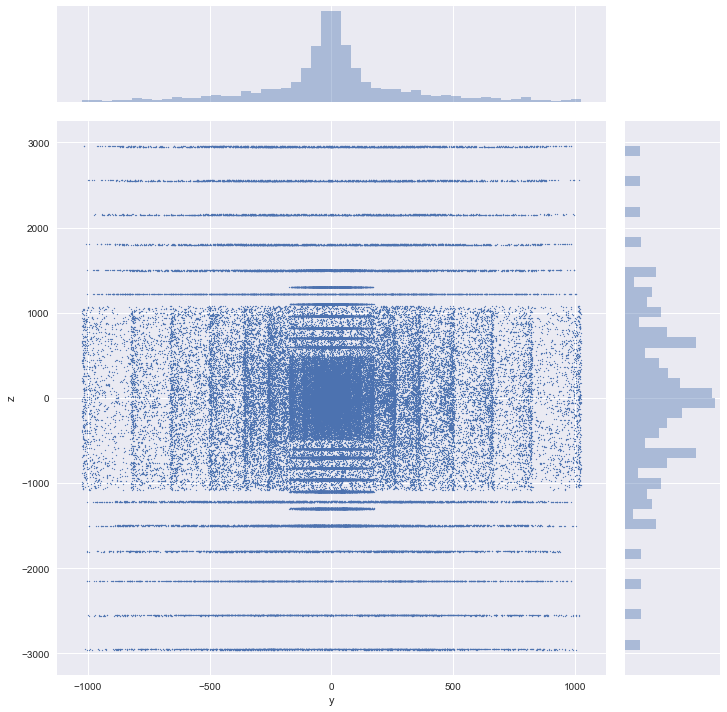

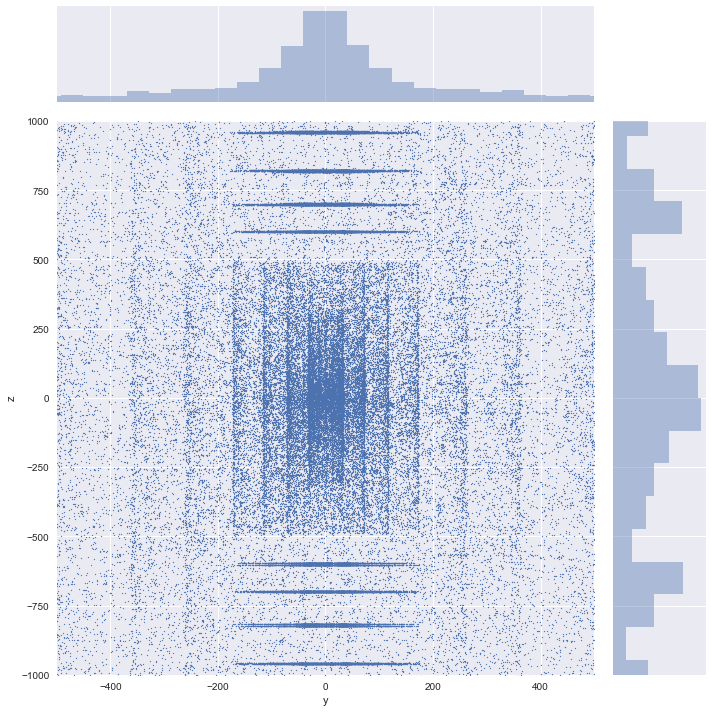

In [21]:
Xview = sns.jointplot(dfHits.y,dfHits.z, stat_func = None, size = 10, s=1)
square = 500
XZoom = sns.jointplot(dfHits.y,dfHits.z, stat_func = None, size = 10, s=1,
                     xlim = {-square,square},
                     ylim = {-square*2,square*2})


## Detector Volume Stuff

Plot hits for each detector volume

### Generates boring static plot in pyplot

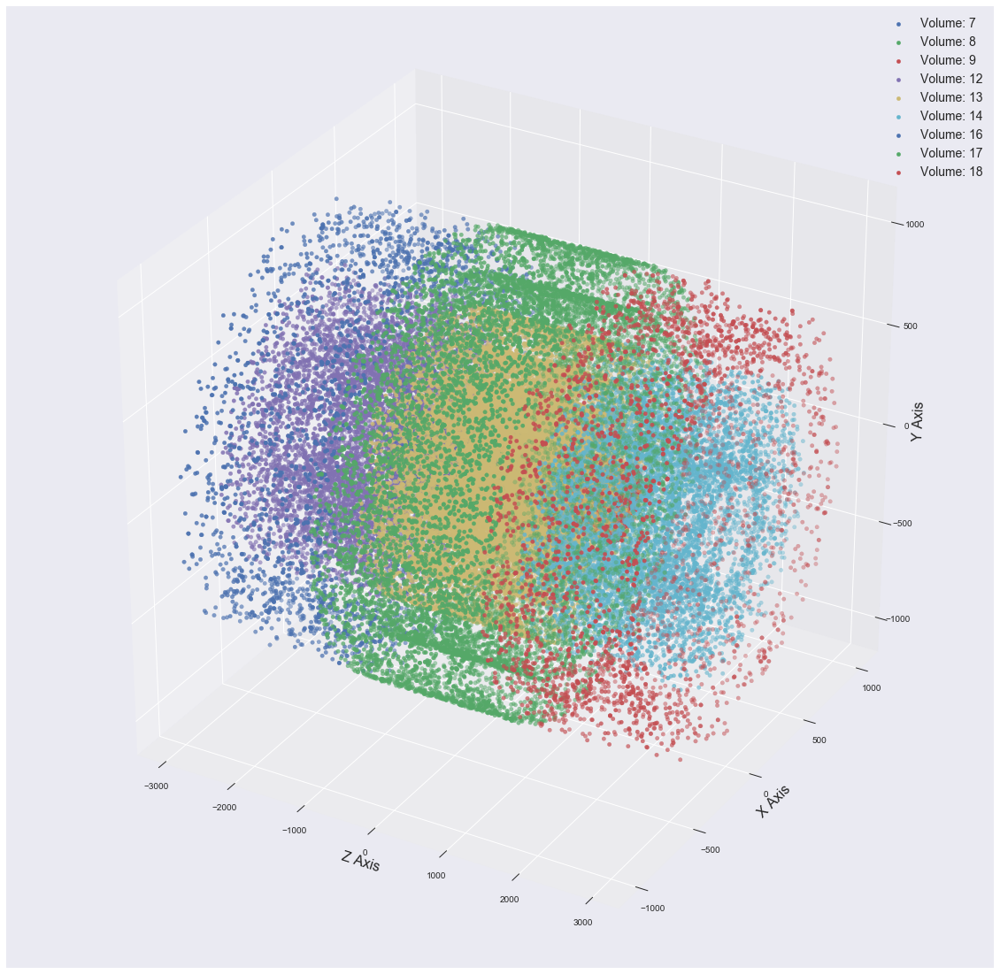

In [278]:
plt.figure(figsize = (20,20))
ax = plt.axes(projection='3d')

volumes = (dfHits.volume_id.unique())

for volume in volumes:
    data = dfHits[dfHits.volume_id == volume]
    ax.scatter(data.z,data.x,data.y, label = 'Volume: {0}'.format(volume))
    
ax.legend(fontsize = 14)
ax.set_xlabel('Z Axis', fontsize = 16)
ax.set_ylabel('X Axis', fontsize = 16)
ax.set_zlabel('Y Axis', fontsize = 16)
plt.show()

### Generates Awesome plot in plotly

In [6]:
volumes = np.asarray(dfHits.volume_id.unique())

depth = (10815)
pointDepth = int(np.floor(depth/(len(volumes))))

dataDict = dict.fromkeys(volumes)

for volume in volumes:
    xVect = []
    yVect = []
    zVect = []
    d = dfHits.loc[ dfHits['volume_id'] == volume ]

    for i in range(0,pointDepth):
        rand = random.random()
        index = (int(np.floor(rand*len(d.x))))
        
#         print (index)
        x = d.x.iloc[index]
        y = d.y.iloc[index]
        z = d.z.iloc[index]
        
        xVect.append(x)
        yVect.append(y)
        zVect.append(z)
        
    trace = go.Scatter3d(
    x = zVect,
    y = xVect,
    z = yVect,
    mode = 'markers',
    marker=dict(
        size=2,
    ),
    name = 'Volume: {0}'.format(volume)
)
    
    dataDict[volume] = (trace)
    
    
bigData = []
for key in dataDict:
    bigData.append(dataDict[key])
fig = go.Figure(data=bigData)
offline.iplot(fig, filename='simple-3d-scatter')


    
print ('Complete')

Complete


## Layer Stuff

Lets play the same game as before and plot hits for each detector layer

In [281]:
layers = np.asarray(dfHits.layer_id.unique())

depth = (10815)
pointDepth = int(np.floor(depth/(len(layers))))

dataDict = dict.fromkeys(layers)

for layer in layers:
    xVect = []
    yVect = []
    zVect = []
    d = dfHits.loc[ dfHits['layer_id'] == layer ]

    for i in range(0,pointDepth):
        rand = random.random()
        index = (int(np.floor(rand*len(d.x))))
        
#         print (index)
        x = d.x.iloc[index]
        y = d.y.iloc[index]
        z = d.z.iloc[index]
        
        xVect.append(x)
        yVect.append(y)
        zVect.append(z)
        
    trace = go.Scatter3d(
    x = zVect,
    y = xVect,
    z = yVect,
    mode = 'markers',
    marker=dict(
        size=2,
    ),
    name = 'Layer: {0}'.format(layer)
)
    
    dataDict[layer] = (trace)
    
    
bigData = []
for key in dataDict:
    bigData.append(dataDict[key])
fig = go.Figure(data=bigData)
offline.iplot(fig, filename='simple-3d-scatter')



## Module Stuff

We play the exact same game again for Modules.

In [282]:
modules = np.asarray(dfHits.module_id.unique())

depth = (10815)
pointDepth = int(np.floor(depth/(len(modules))))

dataDict = dict.fromkeys(modules)

for module in modules:
    xVect = []
    yVect = []
    zVect = []
    d = dfHits.loc[ dfHits['module_id'] == module ]

    for i in range(0,pointDepth):
        rand = random.random()
        index = (int(np.floor(rand*len(d.x))))
        
#         print (index)
        x = d.x.iloc[index]
        y = d.y.iloc[index]
        z = d.z.iloc[index]
        
        xVect.append(x)
        yVect.append(y)
        zVect.append(z)
        
    trace = go.Scatter3d(
    x = zVect,
    y = xVect,
    z = yVect,
    mode = 'markers',
    marker=dict(
        size=2,
    ),
    name = 'Module: {0}'.format(module)
)
    
    dataDict[module] = (trace)
    
    
bigData = []
for key in dataDict:
    bigData.append(dataDict[key])
fig = go.Figure(data=bigData)
offline.iplot(fig, filename='simple-3d-scatter')



## Histograms

Now that we have an idea of the spatial distribution of the detector, lets plot some histograms of the volumes, layers, modules, and whatever cells are.

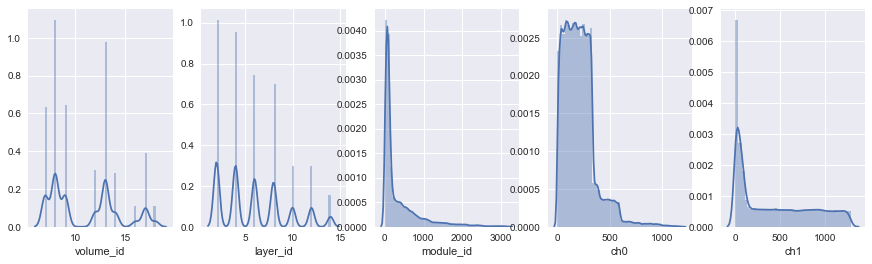

In [294]:
plt.figure(figsize = (15,4))
plt.subplot(1,5,1)
sns.distplot(dfHits.volume_id)
plt.subplot(1,5,2)
sns.distplot(dfHits.layer_id)
plt.subplot(1,5,3)
sns.distplot(dfHits.module_id)
plt.subplot(1,5,4)
sns.distplot(dfCells.ch0)
plt.subplot(1,5,5)
sns.distplot(dfCells.ch1)
plt.show()


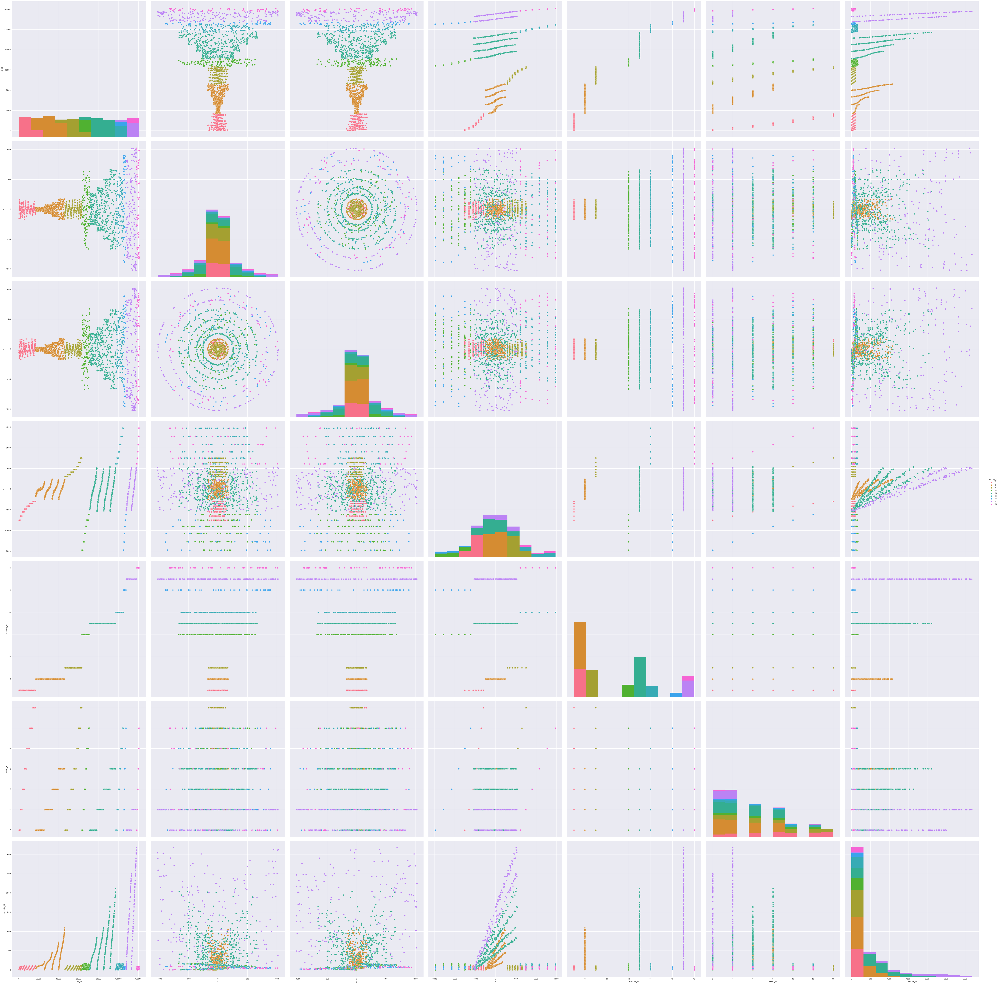

In [8]:
depth = 2000
sample = dfHits.sample(depth)
sns.pairplot(sample, hue='volume_id',size = 10)
plt.show()